# House Sales Prediction Using Neural Network Model
For this project, we would like to create neural network model to predict house price using several attributes such as time of the home sale, location of the house and also the house features (floors etc).

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('TensorFlow_FILES/DATA/kc_house_data.csv')

# Exploratory Data Analysis

In [3]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [4]:
df.duplicated().sum()

0

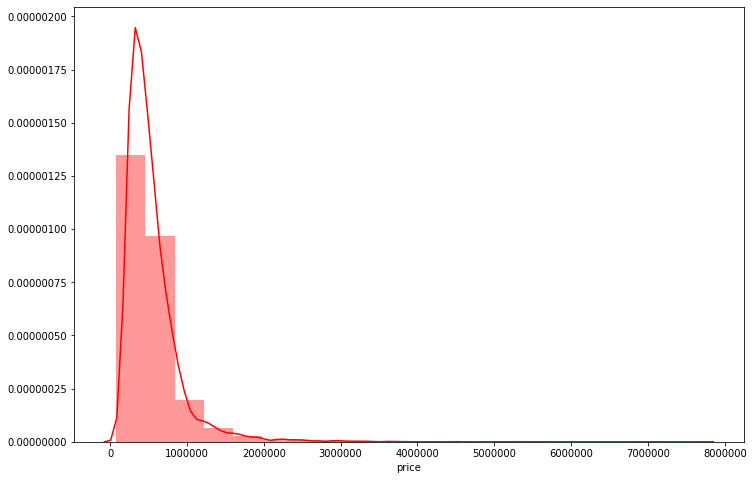

In [5]:
plt.figure(figsize=(12,8))
sns.distplot(df['price'], bins=20, color='red')

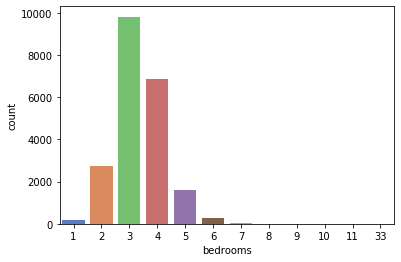

In [6]:
sns.countplot(df['bedrooms'], palette='muted', orient='h')

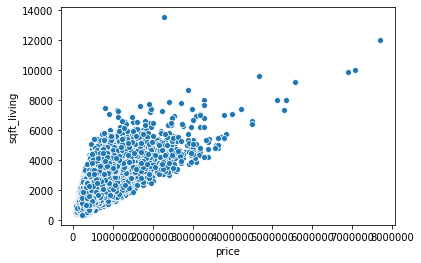

In [7]:
sns.scatterplot(x='price', y='sqft_living', data=df)

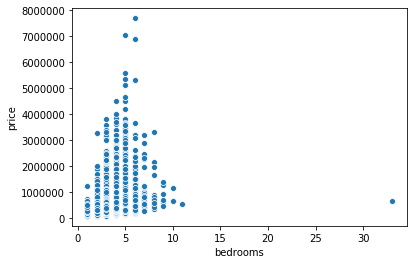

In [8]:
sns.scatterplot(y='price', x='bedrooms', data=df)

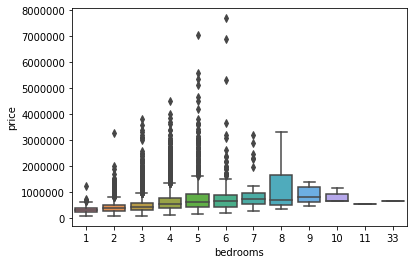

In [9]:
sns.boxplot(x='bedrooms',y='price',data=df)

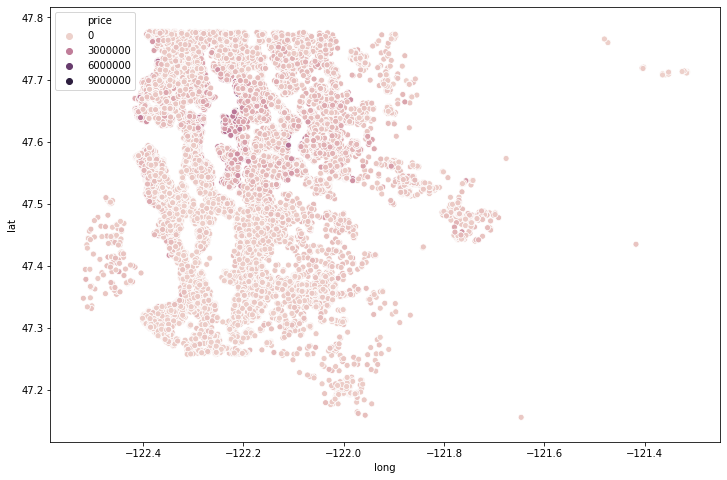

In [10]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat', data=df, hue='price')

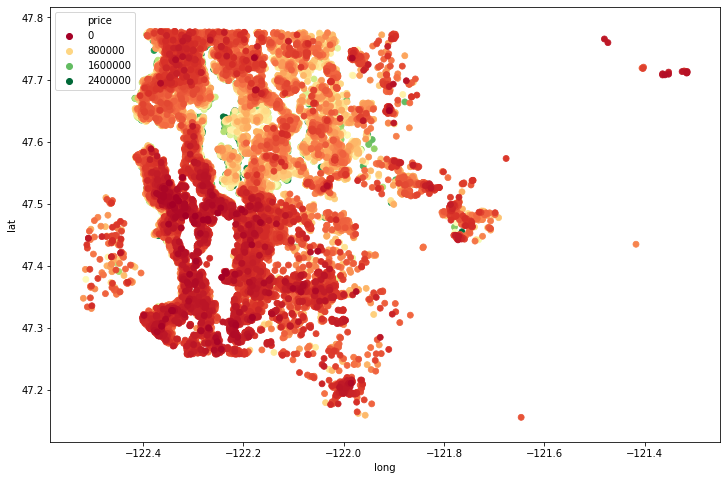

In [11]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='long',y='lat', data=df.sort_values('price',ascending=False).iloc[216:], hue='price', palette='RdYlGn',edgecolor=None)

# Feature Engineering
Let's divide the date variable to month and and year:

In [4]:
df['date'] = pd.to_datetime(df['date'])

In [5]:
df['month'] = df['date'].dt.month

In [6]:
df['year'] = df['date'].dt.year


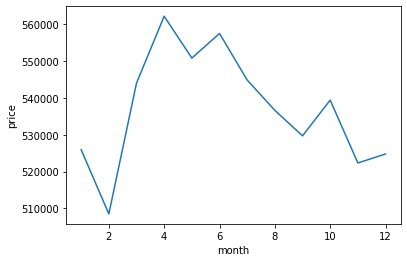

In [14]:
month = df.groupby('month').mean()['price']
sns.lineplot(x=month.index,y=month)

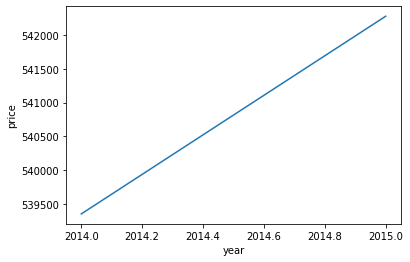

In [16]:
year = df.groupby('year').mean()['price']
sns.lineplot(x=year.index,y=year)

We could see from graph above that the price is correlate well with year. 

In [17]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'month', 'year'],
      dtype='object')

Before modeling, let's drop unnecessary columns:

In [7]:
df = df.drop('id', axis=1)
df = df.drop('date', axis=1)
df = df.drop('zipcode', axis=1)

# Scaling and Train Test Split

In [8]:
X = df.drop('price', axis=1).values
y = df['price'].values

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3,random_state=1)

In [11]:
from sklearn.preprocessing import MinMaxScaler

In [12]:
scaler = MinMaxScaler()

In [13]:
X_train = scaler.fit_transform(X_train)
X_val = scaler.fit_transform(X_val)

In [14]:
X_test = scaler.transform(X_test)

In [26]:
X_train.shape

(15117, 19)

In [27]:
X_val.shape

(6480, 19)

In [28]:
X_test.shape

(6480, 19)

# Model

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam

In [16]:
model = Sequential()

model.add(Dense(19, activation='relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss='mse')

# Training The Model

In [17]:
model.fit(x=X_train,y=y_train,
          validation_data=(X_val,y_val),
          batch_size=128,epochs=100)

Train on 15117 samples, validate on 6480 samples
Epoch 1/100
15117/15117 [==============================] - 2s 133us/sample - loss: 432016430851.6071 - val_loss: 414870783448.8099
Epoch 2/100
15117/15117 [==============================] - 0s 29us/sample - loss: 432011795627.5812 - val_loss: 414863898770.6469
Epoch 3/100
15117/15117 [==============================] - 0s 25us/sample - loss: 432003029268.5078 - val_loss: 414852669136.5927
Epoch 4/100
15117/15117 [==============================] - 0s 30us/sample - loss: 431989340839.1443 - val_loss: 414835865058.9235
Epoch 5/100
15117/15117 [==============================] - 0s 28us/sample - loss: 431970108235.2065 - val_loss: 414813803942.2421
Epoch 6/100
15117/15117 [==============================] - 1s 33us/sample - loss: 431946121732.9788 - val_loss: 414787220113.3827
Epoch 7/100
15117/15117 [==============================] - 1s 47us/sample - loss: 431917733072.0244 - val_loss: 414756411882.5087
Epoch 8/100
15117/15117 [===============

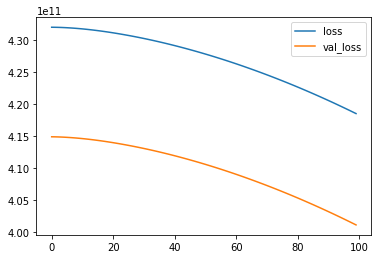

In [53]:
losses = pd.DataFrame(model.history.history)
losses.plot()

Between 1 and 100 epochs, there are no much differences on loss in both train and validation datasets.

In [18]:
from sklearn.metrics import mean_squared_error,mean_absolute_error,explained_variance_score

In [20]:
# Train Model
predictions_train = model.predict(X_train)
mean_absolute_error(y_train, predictions_train)

528786.805776047

In [21]:
# Test Model
predictions_test = model.predict(X_test)
mean_absolute_error(y_test, predictions_test)

524974.3535982862

In [56]:
df['price'].mean()

540296.5735055795

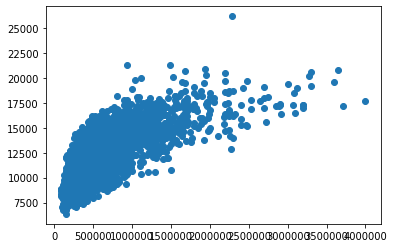

In [58]:
plt.scatter(y_test, predictions)

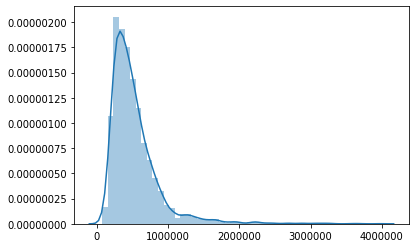

In [59]:
errors = y_test.reshape(6480, 1) - predictions
sns.distplot(errors)

The mean absolute error on test dataset is not far from the mean value of the price variables, which means that the error is still high. The peak value in the residual distribution plot is also not accumulated in zero. Let's try to remodel the neural network!

# Re-train the Model
In this section, we would try to remodel by adding one more layer.

In [30]:
remodel = Sequential()

remodel.add(Dense(19, activation='relu'))
remodel.add(Dense(19, activation='relu'))
remodel.add(Dense(1))

remodel.compile(optimizer = 'adam', loss='mse')

In [31]:
remodel.fit(x=X_train,y=y_train,
          validation_data=(X_val,y_val),
          batch_size=128,epochs=100)

Train on 15117 samples, validate on 6480 samples
Epoch 1/100
15117/15117 [==============================] - 4s 265us/sample - loss: 432013259252.9926 - val_loss: 414860516142.1432
Epoch 2/100
15117/15117 [==============================] - 1s 54us/sample - loss: 431973767632.0074 - val_loss: 414777171907.3185
Epoch 3/100
15117/15117 [==============================] - 1s 81us/sample - loss: 431826387285.4011 - val_loss: 414547730614.0445
Epoch 4/100
15117/15117 [==============================] - 1s 71us/sample - loss: 431502978175.9576 - val_loss: 414107383711.9210
Epoch 5/100
15117/15117 [==============================] - 1s 65us/sample - loss: 430939103193.5247 - val_loss: 413387506998.9926
Epoch 6/100
15117/15117 [==============================] - 1s 57us/sample - loss: 430062178633.2082 - val_loss: 412310947774.2617
Epoch 7/100
15117/15117 [==============================] - 1s 65us/sample - loss: 428796106198.3071 - val_loss: 410806800616.6124
Epoch 8/100
15117/15117 [===============

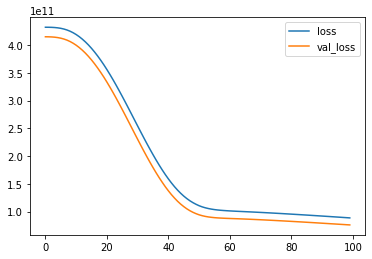

In [32]:
losses = pd.DataFrame(remodel.history.history)
losses.plot()

Different with the previous modek, the loss now decrease sharply around 40 epochs.

In [36]:
# Train Model
predictions_remodel_train = remodel.predict(X_train)
mean_absolute_error(y_train, predictions_remodel_train)

185062.3640934048

In [37]:
# Test Model
predictions_remodel_test = remodel.predict(X_test)
mean_absolute_error(y_test, predictions_remodel_test)

186346.74140625

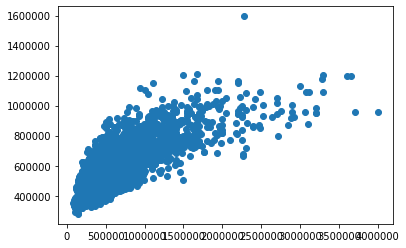

In [39]:
plt.scatter(y_test, predictions_remodel_test)

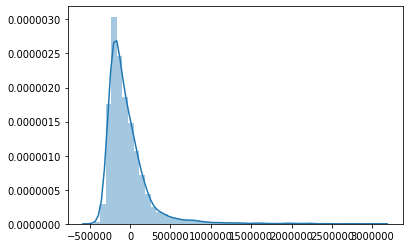

In [38]:
errors = y_test.reshape(6480, 1) - predictions_remodel_test
sns.distplot(errors)

After remodel, the mean absolute error value both on train and test dataset is decreased significantly, while on the remodel residual distribution plot, the peak finally accumulated at zero.